## Exit-2 Simulation 

### Main simulation

In [33]:
import time
import random
import os
import threading
import plotly.express as px
import pandas as pd
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import pandas as pd
from plotly.offline import plot
from plotly.subplots import make_subplots

In [34]:
####################################################################################################################################
def increaseY():
    global Y_t,fps_
    Y_t+=fps_             #virtual queue fps:30
    threading.Timer(1, increaseY).start()

def inferenceFunction(latency):
    time.sleep(latency)
    return 1

def makeResource():
    #making resource
    global min_resource,max_resource,resorce_step,image_num,file_name_resource_data
    resorce_list=[i for i in range(min_resource,max_resource+1,resorce_step)] #length: 111
    #making resource_simulation
    resource_simulation=[0]*image_num
    for each_image in range(image_num):
        if(each_image<(image_num//3)):# early state -> high resource(Idle)
            resource_simulation[each_image]=resorce_list[random.sample(range(-(len(resorce_list)//10),0),k=1)[0]]
        elif((image_num//3)<=each_image<((image_num*2)//3)):# middle state -> low resource
            resource_simulation[each_image]=resorce_list[random.sample(range((len(resorce_list)//10)),k=1)[0]]
        else:# last state -> middle resource
            resource_simulation[each_image]=resorce_list[random.sample(range((len(resorce_list)//3),(len(resorce_list)//3)*2),k=1)[0]]
    with open(file_name_resource_data, 'w+') as file:
        file.write('\n'.join(list(map(str,resource_simulation))))  # '\n' 대신 ', '를 사용하면 줄바꿈이 아닌 ', '를 기준으로 문자열 구분함

def makeDPP(exit,Y_t,p_th):
    global mAP_list
    DPP=(2*Y_t*(p_th-mAP_list[exit]))+((p_th-mAP_list[exit])**2)
    return DPP

def makeLatency(exit,current_resource):
    global computation_exit
    latency=computation_exit[exit]/current_resource
    return latency

def loadResource(file_name):
    resorce_simul=[]
    with open(file_name, "r") as file:
        for i in file:
            resorce_simul.append(int(i.strip()))
    return resorce_simul

def makedataVsearch():
    global total_exit,min_resource,max_resource,resorce_step,file_name_for_Vsearch
    df = pd.DataFrame(columns=['Y_t','exit','DPP','current_resource','latency','V','objective'])
    for exit in range(total_exit):#4번
        for Y_t in tqdm(range(0,1000,10),desc=f"exit:{exit}th Y_t",leave=False):#100번
            DPP=makeDPP(exit,Y_t,p_th)
            for current_resource in range(min_resource*100,max_resource+1,resorce_step*100):#40번 #100Mhz~4Ghz step:100Mhz
                latency=makeLatency(exit,current_resource)
                for V in range(int(1e8),int(1e9),int(1e8)):#1.35e-08(0~1),2.175e-08(1~2),3.925e-08(2~3)#9번
                    objective = DPP + (V*latency)
                    df.loc[len(df)] = {'V' : V,'Y_t' : Y_t,'current_resource' : current_resource, 'exit' : exit, 'latency' : latency,'DPP' : DPP,'objective' : objective}
    df.to_csv(file_name_for_Vsearch, index=False)
####################################################################################################################################
#main function
def main():
    global Y_t,result_latency_mAP,result_data_status,total_exit,file_name_resource_data
    resorce_simul=loadResource(file_name_resource_data)
    #increaseY()             # virtual queue fps:30 !!!!!!!!!!!!!!!!!!START!!!!!!!!!!!!!!
    
    for image in range(image_num): #image만큼 iteration process
        current_resource=resorce_simul[image] #dynamic resource state
        #calculate objective function and get target exit number
        objective=infinity
        target_exit=total_exit-1       #initializing target_exit as final exit
        for exit in range(total_exit):
            latency=makeLatency(exit,current_resource)
            DPP=makeDPP(exit,Y_t,p_th)
            if(DPP + (V*latency)<objective):
                objective = DPP + (V*latency)
                target_exit=exit

        # inference step
        #inferenceFunction(latency) # this make latency function, so this can be commentize
        
        # after inference
        inference_result_mAP=random.randint(int(mAP_list[target_exit]+.5)-10,int(mAP_list[target_exit]+.5)+10)
        result_latency_mAP[0]+= makeLatency(target_exit,current_resource)  #total latency
        result_latency_mAP[1]+= inference_result_mAP/image_num #mAP
        result_data_status.append([current_resource,target_exit,makeDPP(target_exit,Y_t,p_th),makeLatency(target_exit,current_resource),inference_result_mAP])
        Y_t=max(Y_t+p_th-inference_result_mAP,0)
        print(f'{image}번째 이미지의 exit: {target_exit}, resource값: {current_resource}, objective값: {objective}')
####################################################################################################################################
#expectation accuracy
mAP_list=[40,60,80,90]  # 4-exit exist and each has expectation mAP
####################################################################################################################################
#constant variables 
infinity=int(1e9)
total_exit=len(mAP_list)            #exit number is 2
####################################################################################################################################
#hyperparameters
V=4*int(1e8)                    # Latency weight constants
p_th=75                 ####### project's key hyperparameter, this parameter determine the custom tendency of exit ##############################################################
image_num=5000          # image number
#fps_=30                 # fps:30
####################################################################################################################################
#layer class
layer_calculation={     # each layer's calculation value
    'init_layer':1,
    'layer1':7,
    'layer2':10,
    'layer3':50,
    'layer4':16,
    'RPN':4,
    'Detector':16,
    'EE':3}
computation_exit=[0]*total_exit 
computation_exit[0]=(layer_calculation['init_layer']+layer_calculation['EE']+layer_calculation['RPN']+layer_calculation['Detector'])
computation_exit[1]=(computation_exit[0]+layer_calculation['layer1']+layer_calculation['EE']+layer_calculation['RPN']+layer_calculation['Detector'])
computation_exit[2]=(computation_exit[1]+layer_calculation['layer2']+layer_calculation['EE']+layer_calculation['RPN']+layer_calculation['Detector'])
computation_exit[3]=(computation_exit[2]+layer_calculation['layer3']+layer_calculation['RPN']+layer_calculation['Detector'])
#computation_exit=[24, 54, 87, 157]
####################################################################################################################################
#resource stat
min_resource=1000000    # min:1Mhz
max_resource=4000000000 # max:4Ghz
resorce_step=1000000    # step:1Mhz
####################################################################################################################################
#variables initialize
target_exit=total_exit-1# initializing target exit as last exit
Y_t=0                   # initialize virtual queue
objective=0             # objective function value
####################################################################################################################################
result_latency_mAP=[0]*2# result_latency_mAP[0]: latency, result_latency_mAP[1]: mAP
result_data_status=[]   # result_data_status[0]: resource, result_data_status[1]: final-exit, result_data_status[2]: dpp, result_data_status[3]: latency
####################################################################################################################################
#file_name
file_name_resource_data='./data/resource_simul_exit4.txt'
file_name_for_Vsearch='./data/simul_exit4.csv'
####################################################################################################################################
#run
if __name__ == "__main__":
    if not (os.path.exists(file_name_resource_data)):
        makeResource()
    main()

0번째 이미지의 exit: 2, resource값: 3717000000, objective값: 34.362389023405974
1번째 이미지의 exit: 2, resource값: 3615000000, objective값: 34.62655601659751
2번째 이미지의 exit: 2, resource값: 3823000000, objective값: 34.102798849071405
3번째 이미지의 exit: 2, resource값: 3731000000, objective값: 34.32725810774591
4번째 이미지의 exit: 2, resource값: 3975000000, objective값: 33.75471698113208
5번째 이미지의 exit: 2, resource값: 3782000000, objective값: 34.20148069804336
6번째 이미지의 exit: 2, resource값: 3961000000, objective값: 33.78566018682151
7번째 이미지의 exit: 2, resource값: 3999000000, objective값: -6.297824456114029
8번째 이미지의 exit: 2, resource값: 3777000000, objective값: -5.786338363780779
9번째 이미지의 exit: 2, resource값: 3965000000, objective값: 33.77679697351829
10번째 이미지의 exit: 2, resource값: 3719000000, objective값: -5.6426458725463835
11번째 이미지의 exit: 2, resource값: 3762000000, objective값: 14.250398724082935
12번째 이미지의 exit: 2, resource값: 3740000000, objective값: 34.3048128342246
13번째 이미지의 exit: 2, resource값: 3896000000, objective값: 33.93223819301

### Visualization to find V

In [35]:
#tmp
exit=0
Y_t=0
current_resource=1000000000 #1Ghz
DPP=makeDPP(exit,Y_t,p_th)
latency=makeLatency(exit,current_resource)
V=int(2e8)
print(DPP,latency,DPP-(V*latency),sep='\n')

1225
2.4e-08
1220.2


In [36]:
#make dataframe method 2('p_th','Y_t','exit','DPP','current_resource','latency','type','objective','V')
#find V
if not (os.path.exists(file_name_for_Vsearch)):
    makedataVsearch()

In [37]:
if (os.path.exists(file_name_for_Vsearch)):
    df = pd.read_csv(file_name_for_Vsearch)
    fig = px.line_3d(df, x="V", y="Y_t", z="objective", color='exit')
    fig.show()
'''
Y_t랑 DPP는 선형 비례관계라고 추측
Y_t랑 p_th는 ?? 평면인데?
DPP는 p_th는 선형 비례관계 추측
'''

'\nY_t랑 DPP는 선형 비례관계라고 추측\nY_t랑 p_th는 ?? 평면인데?\nDPP는 p_th는 선형 비례관계 추측\n'

In [38]:
if (os.path.exists(file_name_for_Vsearch)):
    df = pd.read_csv(file_name_for_Vsearch)
    fig = px.line_3d(df, x="current_resource", y="exit", z="latency")
    fig.show()
'''
exit, latency 당근빠따로 exit이 뒤로가면 latency 커짐, 그 정도가 지수정도?
exit, current_resource ?? 좀 그지같이 나옴... 같은 exit인데 c_r이 분포가 미쳣는데?
current_resource, latency 리소스가 많으면 latency 작아짐.. 당연 직접적인것이니;;
'''

'\nexit, latency 당근빠따로 exit이 뒤로가면 latency 커짐, 그 정도가 지수정도?\nexit, current_resource ?? 좀 그지같이 나옴... 같은 exit인데 c_r이 분포가 미쳣는데?\ncurrent_resource, latency 리소스가 많으면 latency 작아짐.. 당연 직접적인것이니;;\n'

### Visualization under dynamic resource input

In [39]:
# visualization of result in input resource

#computation_exit=[24, 54, 87, 157]
#expectation accuracy: mAP_list=[45, ]  # 4-exit exist and each has expectation mAP
file_name=file_name_resource_data
resorce_simul=loadResource(file_name)
latency_result=[[0 for _ in range(2)] for _ in range(total_exit)]

for exit in range(total_exit):
    for current_resource in resorce_simul:
        latency_result[exit][0]+=makeLatency(exit,current_resource)
        latency_result[exit][1]+=random.randint(int(mAP_list[exit]+.5)-(mAP_list[exit]//10),int(mAP_list[exit]+.5)+(mAP_list[exit]//10))
    latency_result[exit][1]/=len(resorce_simul)
#my algorithm value latency_result[2][~]
latency_result.append(result_latency_mAP)
#my algorithm value
latency_result

[[0.0006944166702331902, 40.023],
 [0.0015624375080246756, 60.026],
 [0.002517260429595319, 79.9664],
 [0.004542642384442142, 90.0406],
 [0.0016034034595667252, 79.52620000000022]]

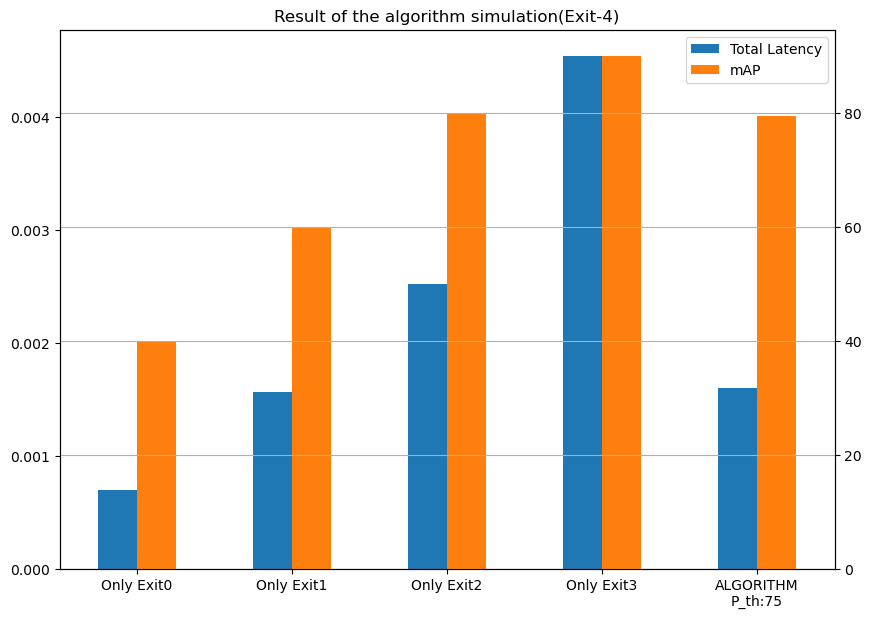

In [40]:
df_result=pd.DataFrame(latency_result,columns=['Total Latency','mAP'],index=['Only Exit0','Only Exit1','Only Exit2','Only Exit3','ALGORITHM\nP_th:75'])
df_result.plot( kind= 'bar' , secondary_y= 'mAP' , rot= 0 ,title='Result of the algorithm simulation(Exit-4)', mark_right=False, grid=True, figsize=(10,7))
plt.show()

In [41]:
#make dataframe method 2('p_th','Y_t','exit','DPP','current_resource','latency','type','objective','V')
file_name=file_name_resource_data
resorce_simul=loadResource(file_name)
df_resource=pd.DataFrame(data=resorce_simul,columns=['resource'])

In [42]:
df_result=pd.DataFrame(result_data_status,columns=['current_resource','target_exit','DPP','Latency','mAP'])
figures = [
            px.line(df_resource, x=df_resource.index, y="resource",height=1000),
            px.line(df_result, x=df_result.index, y="target_exit",height=1000),#limit y-axis
            px.line(df_result, x=df_result.index, y='mAP',height=1000),
            px.line(df_result, x=df_result.index, y="Latency",height=1000)
    ]

fig = make_subplots(rows=len(figures), cols=1,row_heights=[1000]*len(figures), subplot_titles=['current_resource','target_exit','mAP','Latency'])

for i, figure in enumerate(figures):
    for trace in range(len(figure["data"])):
        fig.append_trace(figure["data"][trace], row=i+1, col=1)
        
fig.show()